# NL 2 SPARQL

This is part of the SS18 Natural Language Processing Lab.This code tries to use a bandit-nmt approach to translate Natural Languages question to Sparql queries.
My approach is as follows:

First I tried to implement an encoder-decoder architecture (nmt) with an attention mechanism. This model is checked against a relatively easily de-en language set. Then everything is reset and trained with the en-sparql dataset. This pretrained model should then be used with a second training run in a reinforced manner where the actual queries are run and the results are compared to the ground truth result.

Also different approaches with embeddings where explored. Such as pretrained, split and shared embeddings.

It uses :
* Batches
* teacherforcing
* attention plots
* bleu

This notebook heavily relies on the following papers, tutorials and implementations
* [pytorch seq2seq tutorial](https://github.com/spro/practical-pytorch/blob/master/seq2seq-translation/seq2seq-translation.ipynb)
* [pytorch seq2seq tutorial with batches](https://github.com/spro/practical-pytorch/blob/master/seq2seq-translation/seq2seq-translation-batched.ipynb)
* [Reinforcement Learning for Bandit Neural Machine Translation with
Simulated Human Feedback](https://arxiv.org/pdf/1707.07402.pdf) by Nguyen, Daume and Boyd-Graber
* [bandit-nmt implementation](https://github.com/khanhptnk/bandit-nmt)


# Imports & general definitions

In [61]:
import os
import numpy as np
import csv
import random
import re
import unicodedata
import string
import time
import math
from collections import Counter
import PIL.Image
from torchvision.transforms import ToTensor
import io

import torch
import torch.nn as nn
from torch.autograd import Variable
from torch import optim
import torch.nn.functional as F
from torch.nn import functional
from torch.nn.utils.rnn import pad_packed_sequence as unpack
from torch.nn.utils.rnn import pack_padded_sequence as pack

from tensorboardX import SummaryWriter

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
%matplotlib inline
#import seaborn

In [62]:
torch.__version__=='0.4.0'

True

In [63]:
DATA_FOLDER = ""#"data/"
FILE_NAME = "lcquad_qaldformat"
SAVE_DIR = ""
SHARED = False
ENDE_LANG = False
if ENDE_LANG:
    PRETRAINED_FOLDER = 'pretrained_models/ende/'
else:
    PRETRAINED_FOLDER = 'pretrained_models/ensparql/'


In [64]:
SOS_token = 'SOS'
EOS_token = 'EOS'
PAD_token = 'PAD'

In [65]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('using device: ', DEVICE)

using device:  cpu


## Helpers

In [66]:
class objdict(dict):
    '''
    a dict that behaves like an object
    '''
    def __getattr__(self, name):
        if name in self:
            return self[name]
        else:
            raise AttributeError("No such attribute: " + name)

    def __setattr__(self, name, value):
        self[name] = value

    def __delattr__(self, name):
        if name in self:
            del self[name]
        else:
            raise AttributeError("No such attribute: " + name)


# Basic data loading: NL2SPARQL
I am using the lcquad data set. More information and downloadable [here](https://github.com/AskNowQA/LC-QuAD). It contains natural language sentences and its corresponding sparql queries. In addition it contains the results of that query. The general procedure is the following:

1. load json
2. make tsv with nl sentences and sparql queries
3. use some regex to handle syntax and special characters
4. append SOS, PAD, EOS tokens

In [67]:
import json
def load_data():
    '''
    loads the data
    '''

    with open(f'{DATA_FOLDER}{FILE_NAME}.json') as f:
        data = json.load(f)

        #pprint(data)
        return data
    
def prepare_data(data):
    '''
    converts to tsv
    '''

    input_nl_text = []
    target_sparql = []
    target_answer = []

    for each in data['questions']:
        input_nl_text.append( each['question'][0]['string'])
        target_sparql.append( each['query']['sparql'])
        target_answer.append( each['answers'])

    filename = f'{DATA_FOLDER}inputs_sparql.tsv'

    with open(filename, 'w') as f:
      writer = csv.writer(f, delimiter='\t')
      writer.writerows(zip(input_nl_text,target_sparql))

In [68]:
def make_tsv_from_json():
    data =load_data()
    prepare_data(data)
#make_tsv_from_json()

In [69]:
#### SUBSTITIONS FOR special characters
multi_re_dict = {
    '\t': ' <tab> \t',
    '{': '<curly_open> ',
    '}': ' <curly_close>',
    '<': '<croc_open> ',
    '>': ' <croc_close>',
    ' .': ' <punc>',
    '?': ' <ques>',
    '!': ' <exle>',
}

multi_remap_dict = {
    ' <tab> \t' : '\t',
   '<curly_open> ': '{',
   ' <curly_close>': '}',
   '<croc_open> ':'<',
   ' <croc_close>':'>',
    ' <punc>': '.',
   ' <ques>':' ?',
    '<ques>':' ?',

   '<exle>':'!',
}

def multi_replace(dict,text):
    regex = re.compile("(%s)" % "|".join(map(re.escape, dict.keys())))
    #For each match, look-up corresponding value in dictionary
    return regex.sub(lambda mo: dict[mo.string[mo.start():mo.end()]], text)

def replace():
    #adding special chars
    with open('data'+"/inputs_sparql.tsv") as text:
        new_text = multi_replace(multi_re_dict, text.read())
        
    #lowering except words that are all UPPERCASe
    #new_text = re.sub(r"([A-Z][a-z])", lambda match: match.group(1).lower(), new_text)
    with open(DATA_FOLDER+"inputs_sparqlSUB.tsv", "w") as result:
        result.write(new_text)
#replace()

In [70]:
####TOKENIZATION
with open(DATA_FOLDER+'inputs_sparqlSUB.tsv') as f:
    lines = f.readlines()
sentences_words = []
for line in lines:
    sentences_words.append(line.split())
print(sentences_words[0])

['which', 'comic', 'characters', 'are', 'painted', 'by', 'bill', 'finger', '<ques>', '<tab>', 'SELECT', 'DISTINCT', '<ques>uri', 'WHERE', '<curly_open>', '<ques>uri', '<croc_open>', 'http://dbpedia.org/ontology/creator', '<croc_close>', '<croc_open>', 'http://dbpedia.org/resource/bill_finger', '<croc_close>', '<punc>', '<ques>uri', '<croc_open>', 'http://www.w3.org/1999/02/22-rdf-syntax-ns#type', '<croc_close>', '<croc_open>', 'http://dbpedia.org/ontology/comicscharacter', '<croc_close>', '<curly_close>']


In [71]:
#input
####TOKENIZATION
with open(DATA_FOLDER+'inputs_sparqlSUB.tsv') as f:
    lines = f.readlines()
sentences = []
for line in lines:
    #split question  , answer
    sentences.append(line.split('<tab> \t'))
sentences.append(SOS_token+' '+EOS_token+' '+PAD_token+'<tab> \t'+SOS_token+' '+EOS_token+' '+PAD_token)

In [72]:
sentences[0]

['which comic characters are painted by bill finger <ques> ',
 'SELECT DISTINCT  <ques>uri WHERE <curly_open>  <ques>uri <croc_open> http://dbpedia.org/ontology/creator <croc_close> <croc_open> http://dbpedia.org/resource/bill_finger <croc_close>  <punc>  <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/comicscharacter <croc_close> <curly_close>\n']

# Lang: WordIndex class
The Lang object contains word2index references for the input_lang/english and the output_lang/sparql

In [73]:
class Lang:
    def __init__(self, name):
        self.name = name
        self.word2index = {}
        self.word2count = {}
        self.index2word = {}
        self.n_words = 0 # Count SOS and EOS
      
    def index_words(self, sentence):
        for word in sentence.split():
            self.index_word(word)

    def index_word(self, word):
        
        if word not in self.word2index:
            self.word2index[word] = self.n_words
            self.word2count[word] = 1
            self.index2word[self.n_words] = word
            self.n_words += 1
        else:
            self.word2count[word] += 1

def unicode_to_ascii(s):
    return ''.join(
        c for c in unicodedata.normalize('NFD', s)
        if unicodedata.category(c) != 'Mn'
    )

# Lowercase, trim, and remove non-letter characters
def normalize_string(s):
    s = unicode_to_ascii(s)
    #s = re.sub(r"([.!?])", r" \1", s)
    #s = re.sub(r"[^a-zA-Z.!?]+", r" ", s)
    return s

### read nl2sparql

In [74]:
def read_langs(reverse=False):
    print("Reading lines...")

    # Read the file and split into lines
    lines = open(DATA_FOLDER+'inputs_sparqlSUB.tsv').read().strip().split('\n')
    #append SOS EOS token 
    lines.append(SOS_token+' '+EOS_token+' '+PAD_token+'<tab> \t'+SOS_token+' '+EOS_token+' '+PAD_token)
    # Split every line into pairs and normalize
    pairs = [[normalize_string(s) for s in l.split('<tab> \t')] for l in lines]
    # Reverse pairs, make Lang instances
    if reverse:
        pairs = [list(reversed(p)) for p in pairs]
        input_lang = Lang('sparql')
        output_lang = Lang('eng')
    else:
        input_lang = Lang('eng')
        output_lang = Lang('sparql')

    return input_lang, output_lang, pairs



In [75]:
def prepare_data(reverse=False):
    input_lang, output_lang, pairs = read_langs(reverse)
    print("Read %s sentence pairs" % len(pairs))
    
    print("Indexing words...")
    for pair in pairs:
        input_lang.index_words(pair[0])
        output_lang.index_words(pair[1])
    print('... Finished Indexing')   
    print('Deleting form pairs: ',pairs[-1])
    del pairs[-1]
    return input_lang, output_lang, pairs

#vecmodel =  FastText.load('pretrained_models/fasttext/nl_2_sparql_ver3_3')

input_lang, output_lang, pairs = prepare_data(reverse= False)
# Print an example pair
print('Example sentence pair: ')
#print(pairs[random.choice(len(pairs))])
print(random.choice(pairs))

Reading lines...
Read 5001 sentence pairs
Indexing words...
... Finished Indexing
Deleting form pairs:  ['SOS EOS PAD', 'SOS EOS PAD']
Example sentence pair: 
['was buzz williams the headcoach of the marquette golden eagles mens team <ques> ', "ASK WHERE <curly_open>  <croc_open> http://dbpedia.org/resource/2013–14_marquette_golden_eagles_men's_basketball_team <croc_close> <croc_open> http://dbpedia.org/property/headcoach <croc_close> <croc_open> http://dbpedia.org/resource/buzz_williams <croc_close>  <curly_close>"]


In [76]:
val_split = 0.15
split_idx = int(len(pairs)*val_split)
pairs_val = pairs[:split_idx]
pairs = pairs[split_idx:]
print('length val', len(pairs_val))
print('length pairs', len(pairs))

length val 750
length pairs 4250


### read EnDe Language
if you also want to to test against an englisch - german download the dataset [here](http://www.manythings.org/anki/) and put it into the datafolder. Don't forget to put the ENDE_LANG flag to True in the beginning of this document.

In [77]:
def eng_de_lang():
    multi_re_dict_en = {
    '\t': '\t',
    '{': '<curly_open> ',
    '}': ' <curly_close>',
    '<': '<croc_open> ',
    '>': ' <croc_close>',
    '.': ' <punc>',
    '?': ' <ques>',
    '!': ' <exle>',
    }
    with open('deu.txt') as text:
        new_text_en = multi_replace(multi_re_dict_en, text.read())

    #lowering except words that are all UPPERCASe
    new_text_en = re.sub(r"([A-Z][a-z])", lambda match: match.group(1).lower(), new_text_en)
    with open('deu_re.txt', "w") as result:
        result.write(new_text_en)  
    with open('deu_re.txt') as f:
        lines = f.readlines()
    sentences_en = []
    for line in lines:
        #split question  , answer
        sentences_en.append(line.split('\t'))
    #sentences.append([SOS_token+' '+EOS_token+' '+PAD_token+' \t'+SOS_token+' '+EOS_token+' '+PAD_token])  
    # Split every line into pairs and normalize
    #pairs = [[normalize_string(s) for s in l for l in sentences]]
    pairs = [[normalize_string(s) for s in l] for l in sentences_en]
    pairs.append([SOS_token+' '+EOS_token+' '+PAD_token, SOS_token+' '+EOS_token+' '+PAD_token])
    # Reverse pairs, make Lang instances
    reverse=False
    if reverse:
        pairs = [list(reversed(p)) for p in pairs]
        input_lang = Lang('de')
        output_lang = Lang('en')
    else:
        input_lang = Lang('en')
        output_lang = Lang('de')

    for pair in pairs:
        input_lang.index_words(pair[0])
        output_lang.index_words(pair[1])
    print('... Finished Indexing')   
    print('Deleting form pairs: ',pairs[-1])
    del pairs[-1]
    
    return input_lang, output_lang, pairs
if ENDE_LANG:
    input_lang, output_lang, ende = eng_de_lang()
    print(ende[0])
    val_split = 0.15
    random.shuffle(ende)
    split_idx = int(len(ende)*val_split)
    pairs_val = ende[:split_idx]
    pairs = ende[split_idx:]
    print('length val', len(pairs_val))
    print('length pairs', len(pairs))

In [78]:
print('translating '+input_lang.name+' with '+str(input_lang.n_words)+' entries to '+output_lang.name+' with '+str(output_lang.n_words)+' entries')

translating eng with 7597 entries to sparql with 4733 entries


# EncoderDecoder Model

In [79]:
# Return a list of indexes, one for each word in the sentence
def indexes_from_sentence(lang, sentence):
    a = [lang.word2index[word] for word in sentence.split()]
    a.append(lang.word2index[EOS_token])
    return a

def variable_from_sentence(lang, sentence):
    
    indexes = indexes_from_sentence(lang, sentence)
    var = Variable(torch.LongTensor(indexes).view(-1, 1))
    if DEVICE.type == 'gpu': var = var.cuda()
    return var

def variables_from_pair(pair,input_lang, output_lang):
    input_variable = variable_from_sentence(input_lang, pair[0])
    target_variable = variable_from_sentence(output_lang, pair[1])
    return (input_variable, target_variable)

In [80]:
variables_from_pair(pairs[5],input_lang, output_lang)

(tensor([[    0],
         [   22],
         [   25],
         [ 2402],
         [  283],
         [ 1969],
         [ 2403],
         [ 2404],
         [ 2405],
         [    8],
         [ 7595]]), tensor([[    0],
         [    1],
         [    2],
         [    3],
         [    4],
         [    2],
         [    5],
         [ 1428],
         [    7],
         [    5],
         [ 1429],
         [    7],
         [    9],
         [    2],
         [    5],
         [   10],
         [    7],
         [    5],
         [  886],
         [    7],
         [   12],
         [ 4731]]))

In [81]:
def random_batch(batch_size, pairs, input_lang, output_lang, evaluation = False):
    input_seqs = []
    target_seqs = []

    # Choose random pairs
    for i in range(batch_size):
        #ix = random.choice(len(pairs))
        #pair = pairs[ix]
        pair = random.choice(pairs)
        
        input_seqs.append(indexes_from_sentence(input_lang, pair[0]))
        target_seqs.append(indexes_from_sentence(output_lang, pair[1]))

        
    seq_pairs = sorted(zip(input_seqs, target_seqs), key=lambda p: len(p[0]), reverse=True)
    input_seqs, target_seqs = zip(*seq_pairs)
    
    # For input and target sequences, get array of lengths and pad with 0s to max length
    input_lengths = [len(s) for s in input_seqs]
    input_padded = [pad_seq(s, max(input_lengths), input_lang) for s in input_seqs]
    target_lengths = [len(s) for s in target_seqs]
    target_padded = [pad_seq(s, max(target_lengths), output_lang) for s in target_seqs]
    
    
    # Turn padded arrays into (batch_size x max_len) tensors, transpose into (max_len x batch_size)
    if evaluation:
        with torch.no_grad():
            input_var = Variable(torch.LongTensor(input_padded)).transpose(0, 1)
            target_var = Variable(torch.LongTensor(target_padded)).transpose(0, 1)           
            input_lengths = Variable(torch.LongTensor(input_lengths))
    else:
        
        input_var = Variable(torch.LongTensor(input_padded)).transpose(0, 1)
        target_var = Variable(torch.LongTensor(target_padded)).transpose(0, 1)
        input_lengths = Variable(torch.LongTensor(input_lengths))
    
    if DEVICE.type == 'gpu':
        input_var = input_var.cuda()
        target_var = target_var.cuda()
        
    return input_var, input_lengths, target_var, target_lengths


In [82]:
# Pad a with the PAD symbol
def pad_seq(seq, max_length, lang):
    seq += [lang.word2index[PAD_token] for i in range(max_length - len(seq))]
    return seq

In [83]:
input_lang.name

'eng'

In [84]:
input_var, input_lengths, target_var, target_lengths = random_batch(4, pairs, input_lang, output_lang)
print(input_var)
print(input_var.size())
print(input_lengths)

tensor([[   91,     0,    27,     0],
        [  412,   328,   124,   215],
        [  129,    49,   125,   556],
        [   71,  5224,   875,   164],
        [  452,  4461,   129,  2094],
        [   37,    58,    12,   163],
        [  274,   142,   974,    99],
        [ 5087,    12,   348,   631],
        [   27,  1658,    27,  3788],
        [   12,   328,  6075,     8],
        [ 5088,    15,   430,  7595],
        [ 1686,  5225,     8,  7596],
        [ 1068,  1660,  7595,  7596],
        [  239,     8,  7596,  7596],
        [    8,  7595,  7596,  7596],
        [ 7595,  7596,  7596,  7596]])
torch.Size([16, 4])
tensor([ 16,  15,  13,  11])


### Encoder

In [85]:
if SHARED:
    model_ted = model_ted

In [86]:
optEncoder_test = objdict()
optEncoder_test.n_layers = 2
optEncoder_test.bidirectional = True 
optEncoder_test.dropout = 0
optEncoder_test.hidden_size = 128 
optEncoder_test.input_size = input_lang.n_words
optEncoder_test.emb_dim = 128

class EncoderRNN(nn.Module):
    def __init__(self, opt):
        super(EncoderRNN, self).__init__()
        self.n_layers = opt.n_layers
        self.dropout = opt.dropout
        self.bidirectional = opt.bidirectional
        self.num_directions = 2 if opt.bidirectional else 1
        self.hidden_size = opt.hidden_size // self.num_directions
        self.emb_dim = opt.emb_dim
        
        if SHARED:
            model_ted.wv
            weights = torch.FloatTensor(rt.syn0)
            self.embedding = nn.Embedding.from_pretrained(weights)
        else:
            self.embedding = nn.Embedding(opt.input_size, self.emb_dim, padding_idx=input_lang.word2index[PAD_token])
        
        self.rnn = getattr(nn, 'LSTM')(
                           input_size=self.emb_dim,
                           hidden_size=self.hidden_size,
                           num_layers=self.n_layers,
                           dropout=self.dropout, 
                           bidirectional=self.bidirectional)
        
    def forward(self, input_seqs, input_lengths, hidden=None):
        # Note: we run this all at once (over multiple batches of multiple sequences)
        embedded = self.embedding(input_seqs)
        packed = torch.nn.utils.rnn.pack_padded_sequence(embedded, input_lengths)
        outputs, hidden = self.rnn(packed, hidden)
        outputs, output_lengths = torch.nn.utils.rnn.pad_packed_sequence(outputs) # unpack (back to padded)
        outputs = outputs[:, :, :self.hidden_size] + outputs[:, : ,self.hidden_size:] # Sum bidirectional outputs
        
        if self.bidirectional:
            hidden = self._cat_directions(hidden)
        
        return outputs, hidden
    
    def _cat_directions(self, hidden):
        
        def _cat(h):
            return torch.cat([h[0:h.size(0):2], h[1:h.size(0):2]], 2)
            
        if isinstance(hidden, tuple):
            # LSTM hidden contains a tuple (hidden state, cell state)
            hidden = tuple([_cat(h) for h in hidden])
        else:
            # GRU hidden
            hidden = _cat(hidden)
            
        return hidden         

In [87]:
test_batch = 3
encoder_test = EncoderRNN(optEncoder_test)
print(encoder_test)

if DEVICE.type == 'gpu':
    encoder_test.cuda()
input_batches, input_lengths, target_batches, target_lengths = random_batch(test_batch, pairs, input_lang, output_lang)
encoder_outputs, encoder_hidden = encoder_test(input_batches, input_lengths, None)
print('input_batches', input_batches.size()) # (max_len x batch_size)
print('target_batches', target_batches.size()) # (max_len x batch_size)
print('encoder_outputs', encoder_outputs.size()) # max_len x batch_size x hidden_size
#print('encoder_hidden', encoder_hidden) # n_layers * 2 x batch_size x hidden_size

EncoderRNN(
  (embedding): Embedding(7597, 128, padding_idx=7596)
  (rnn): LSTM(128, 64, num_layers=2, bidirectional=True)
)
input_batches torch.Size([17, 3])
target_batches torch.Size([22, 3])
encoder_outputs torch.Size([17, 3, 64])


### Decoder

In [88]:
def sequence_mask(sequence_length, max_len=None):
    if max_len is None:
        max_len = sequence_length.data.max()
    batch_size = sequence_length.size(0)
    seq_range = torch.range(0, max_len - 1).long()
    seq_range_expand = seq_range.unsqueeze(0).expand(batch_size, max_len)
    seq_range_expand = Variable(seq_range_expand)
    if sequence_length.is_cuda:
        seq_range_expand = seq_range_expand.cuda()
    seq_length_expand = (sequence_length.unsqueeze(1)
                         .expand_as(seq_range_expand))
    return seq_range_expand < seq_length_expand


def masked_cross_entropy(logits, target, length):
    length = Variable(torch.LongTensor(length))
    if DEVICE =='gpu':
        length = length.cuda()

    """
    Args:
        logits: A Variable containing a FloatTensor of size
            (batch, max_len, num_classes) which contains the
            unnormalized probability for each class.
        target: A Variable containing a LongTensor of size
            (batch, max_len) which contains the index of the true
            class for each corresponding step.
        length: A Variable containing a LongTensor of size (batch,)
            which contains the length of each data in a batch.
    Returns:
        loss: An average loss value masked by the length.
    """

    # logits_flat: (batch * max_len, num_classes)
    logits_flat = logits.view(-1, logits.size(-1))
    # log_probs_flat: (batch * max_len, num_classes)
    log_probs_flat = functional.log_softmax(logits_flat, dim = 1)
    # target_flat: (batch * max_len, 1)
    target_flat = target.view(-1, 1)
    # losses_flat: (batch * max_len, 1)
    losses_flat = -torch.gather(log_probs_flat, dim=1, index=target_flat)
    # losses: (batch, max_len)
    losses = losses_flat.view(*target.size())
    # mask: (batch, max_len)
    mask = sequence_mask(sequence_length=length, max_len=target.size(1))
    losses = losses * mask.float()
    loss = losses.sum() / length.float().sum()
    
    
    # (batch_size * max_tgt_len,)
    pred_flat = log_probs_flat.max(1)[1]
    # (batch_size * max_tgt_len,) => (batch_size, max_tgt_len) => (max_tgt_len, batch_size)
    pred_seqs = pred_flat.view(*target.size()).transpose(0,1).contiguous()
    # (batch_size, max_len) => (batch_size * max_tgt_len,)
    mask_flat = mask.view(-1)
    
    # `.float()` IS VERY IMPORTANT !!!
    # https://discuss.pytorch.org/t/batch-size-and-validation-accuracy/4066/3
    num_corrects = int(pred_flat.eq(target_flat.squeeze(1)).masked_select(mask_flat).float().data.sum())
    num_words = length.data.sum()

    return loss, pred_seqs, num_corrects, num_words


In [89]:
optDecoder_test = objdict()
optDecoder_test.encoder = encoder_test
optDecoder_test.dropout = 0
optDecoder_test.emb_dim = 128
optDecoder_test.bias = True
optDecoder_test.vocab_size = output_lang.n_words
optDecoder_test.output_size = output_lang.n_words

class DecoderRNN(nn.Module):
    
    def __init__(self, opt):
        super(DecoderRNN, self).__init__()
        self.hidden_size = opt.encoder.hidden_size * opt.encoder.num_directions
        self.n_layers = opt.encoder.n_layers
        self.dropout = opt.dropout
        self.emb_dim = opt.emb_dim
        self.output_size = opt.output_size

        if SHARED:
            model_ted.wv
            weights = torch.FloatTensor(rt.syn0)
            self.embedding = nn.Embedding.from_pretrained(weights)
        else:
            self.embedding = nn.Embedding(opt.output_size, self.hidden_size, padding_idx=output_lang.word2index[PAD_token])

        self.rnn = getattr(nn, 'LSTM')(
                               input_size=self.emb_dim,
                               hidden_size=self.hidden_size,
                               num_layers=self.n_layers,
                               dropout=self.dropout)
        
        #                        * opt.encoder.num_directions
        self.W_a = nn.Linear(opt.encoder.hidden_size, self.hidden_size, bias = opt.bias)
        self.W_c = nn.Linear(opt.encoder.hidden_size  + self.hidden_size, 
                                 self.hidden_size, bias=opt.bias)
        
        self.W_s = nn.Linear(self.hidden_size, opt.vocab_size, bias=opt.bias)
        self.W_s.weight = self.embedding.weight
    
    def forward(self, input_seqs, decoder_hidden, encoder_outputs, seq_lens):
        
        input_seq = input_seqs.unsqueeze(0)
        emb = self.embedding(input_seq)
        decoder_output, decoder_hidden = self.rnn(emb, decoder_hidden)
        decoder_output = decoder_output.transpose(0,1)
        
        #attetion
        attention_scores = torch.bmm(decoder_output, self.W_a(encoder_outputs).transpose(0,1).transpose(1,2))
        
        attention_mask = sequence_mask(seq_lens).unsqueeze(1)

        attention_scores.data.masked_fill_(1 - attention_mask.data, -float('inf'))
        try: # torch 0.3.x
            attention_weights = F.softmax(attention_scores.squeeze(1), dim=1).unsqueeze(1)
        except:
            attention_weights = F.softmax(attention_scores.squeeze(1)).unsqueeze(1)
        
        context_vector = torch.bmm(attention_weights, encoder_outputs.transpose(0,1))

        
        concat_input = torch.cat([context_vector, decoder_output], -1)

        concat_output = F.tanh(self.W_c(concat_input))

        attention_weights = attention_weights.squeeze(1)

        output = self.W_s(concat_output)    

        output = output.squeeze(1)

        del seq_lens

        return output, decoder_hidden, attention_weights
            

In [90]:
decoder_test = DecoderRNN(optDecoder_test)
print(decoder_test)

max_target_length = max(target_lengths)
# Prepare decoder input and outputs
decoder_input = Variable(torch.LongTensor([output_lang.word2index[SOS_token]] * test_batch))
decoder_hidden = encoder_hidden # Use last (forward) hidden state from encoder
all_decoder_outputs = Variable(torch.zeros(max_target_length, test_batch, decoder_test.output_size))
if DEVICE == 'gpu':
    all_decoder_outputs = all_decoder_outputs.cuda()
    decoder_input = decoder_input.cuda()
    
# Run through decoder one time step at a time
for t in range(max_target_length):
    decoder_output, decoder_hidden, decoder_attn = decoder_test(
        decoder_input, decoder_hidden, encoder_outputs, input_lengths
    )
    all_decoder_outputs[t] = decoder_output # Store this step's outputs
    decoder_input = target_batches[t] # Next input is current target
    
# Test masked cross entropy loss
loss, pred_seqs, num_corrects, num_words = masked_cross_entropy(
    all_decoder_outputs.transpose(0, 1).contiguous(),
    target_batches.transpose(0, 1).contiguous(),
    target_lengths
)
print('loss', loss.item())
print(loss, pred_seqs, num_corrects, num_words)

DecoderRNN(
  (embedding): Embedding(4733, 128, padding_idx=4732)
  (rnn): LSTM(128, 128, num_layers=2)
  (W_a): Linear(in_features=64, out_features=128, bias=True)
  (W_c): Linear(in_features=192, out_features=128, bias=True)
  (W_s): Linear(in_features=128, out_features=4733, bias=True)
)
loss 8.766530990600586
tensor(8.7665) tensor([[ 2627,  2438,  2438],
        [ 2594,  2594,  2438],
        [ 2594,  2594,  2438],
        [ 1672,  2438,  2438],
        [ 1672,  2438,  2438],
        [ 1672,  2438,  4478],
        [ 2627,  2627,  2627],
        [ 2627,  2627,  2627],
        [ 2627,  2627,  2627],
        [ 2627,  2627,  2627],
        [ 2627,  2627,  2627],
        [ 2627,  2627,  2627],
        [ 2627,  2627,  2627],
        [ 2594,  1135,  2627],
        [ 2594,  2627,  2627],
        [ 2594,  2627,  2627],
        [ 2594,  2627,  2627],
        [ 1672,  2627,  2627],
        [ 1672,  2627,  2627],
        [ 1672,  2627,  2627],
        [ 1672,  2627,  2438],
        [ 1672,  26

## Vis and Eval stuff

In [91]:
def as_minutes(s):
    m = math.floor(s / 60)
    s -= m * 60
    return '%dm %ds' % (m, s)

def time_since(since, percent):
    now = time.time()
    s = now - since
    es = s / (percent)
    rs = es - s
    return '%s (- %s)' % (as_minutes(s), as_minutes(rs))

In [92]:
def show_plot(points):
    plt.figure()
    fig, ax = plt.subplots()
    loc = ticker.MultipleLocator(base=0.2) # put ticks at regular intervals
    ax.yaxis.set_major_locator(loc)
    plt.plot(points)

# Model init and Params

In [93]:
#init Encoder
optEncoder = objdict()
optEncoder.n_layers = 4
optEncoder.bidirectional = True 
optEncoder.dropout = 0.1
optEncoder.hidden_size = 512 
optEncoder.input_size = input_lang.n_words
optEncoder.emb_dim = 512
encoder = EncoderRNN(optEncoder)

#init Decoder
optDecoder = objdict()
optDecoder.encoder = encoder
optDecoder.dropout = 0.1
optDecoder.emb_dim = 512
optDecoder.bias = True
optDecoder.vocab_size = output_lang.n_words
optDecoder.output_size = output_lang.n_words
decoder = DecoderRNN(optDecoder)

#training params
optTraining = objdict()
optTraining.batch_size = 64
optTraining.clip = 50.0
optTraining.decoderLR = 5.0
optTraining.lr = 0.001 
optTraining.nEpochs = 5000
optTraining.epoch = 0

optTraining.evalBatchSize = 30
optTraining.teacherForcing = 0.5
optTraining.printEvery = 5
optTraining.evaluateEvery = 20
optTraining.plotEmbeddingEvery = 150
optTraining.saveEvery = 100
optTraining.saveTrainingStatsEvery = 15

#optimizer
encoder_opti = optim.Adam(encoder.parameters(), lr = optTraining.lr)
decoder_opti = optim.Adam(decoder.parameters(), lr = optTraining.lr)


#pretrained?
optTraining.loadPretrained = True
if ENDE_LANG:
    epoch_path = 'epoch_1500_timestamp_1532303706.2454145'
else:
    epoch_path = 'epoch_2100_timestamp_1532353005.9708378'

optTraining.encoderloadFromPath = PRETRAINED_FOLDER+'encoder_'+epoch_path
optTraining.decoderloadFromPath = PRETRAINED_FOLDER+'decoder_'+epoch_path
optTraining.optimizerEncoderloadFromPath = PRETRAINED_FOLDER+'encoder_opti_'+epoch_path
optTraining.optimizerDecoderloadFromPath = PRETRAINED_FOLDER+'decoder_opti_'+epoch_path

if optTraining.loadPretrained:
    a = optTraining.encoderloadFromPath.index('epoch_')+len('epoch_')
    b = optTraining.encoderloadFromPath.index('_timestamp')
    optTraining.epoch = int(optTraining.encoderloadFromPath[a:b])
    print('setting start epoch to:', optTraining.epoch)
    print('Loading model from: '+ PRETRAINED_FOLDER)
    encoder.load_state_dict(torch.load(optTraining.encoderloadFromPath))
    decoder.load_state_dict(torch.load(optTraining.decoderloadFromPath))
    encoder_opti.load_state_dict(torch.load(optTraining.optimizerEncoderloadFromPath))
    decoder_opti.load_state_dict(torch.load(optTraining.optimizerDecoderloadFromPath))   

print('Models: ')
print(encoder)
print(decoder)

if DEVICE == 'gpu':
    encoder.cuda()
    decoder.cuda()

setting start epoch to: 2100
Loading model from: pretrained_models/ensparql/
Models: 
EncoderRNN(
  (embedding): Embedding(7597, 512, padding_idx=7596)
  (rnn): LSTM(512, 256, num_layers=4, dropout=0.1, bidirectional=True)
)
DecoderRNN(
  (embedding): Embedding(4733, 512, padding_idx=4732)
  (rnn): LSTM(512, 512, num_layers=4, dropout=0.1)
  (W_a): Linear(in_features=256, out_features=512, bias=True)
  (W_c): Linear(in_features=768, out_features=512, bias=True)
  (W_s): Linear(in_features=512, out_features=4733, bias=True)
)


# Training method

In [94]:
l =[]
l2 =[]
for each in pairs:
    l.append(len(each[0].split(' ')))
    l2.append(len(each[1].split(' ')))

if max(l) > max(l2):
    MAX_LENGTH =  max(l)
else:
    MAX_LENGTH =  max(l2)
print(MAX_LENGTH)

34


In [95]:
def train(input_batches, input_lengths, target_batches, target_lengths, encoder, decoder, encoder_optimizer, decoder_optimizer, batch_size, clip, max_length=MAX_LENGTH):
    
    encoder.train()
    decoder.train()
    # Zero gradients of both optimizers
    encoder_optimizer.zero_grad()
    decoder_optimizer.zero_grad()

    # Run words through encoder
    encoder_outputs, encoder_hidden = encoder(input_batches, input_lengths, None)
    
    # Prepare input and output variables
    decoder_input = Variable(torch.LongTensor([output_lang.word2index[SOS_token]] * batch_size))
    decoder_hidden = encoder_hidden
    #decoder_hidden = encoder_hidden[:decoder.layers] # Use last (forward) hidden state from encoder

    max_target_length = max(target_lengths)
    all_decoder_outputs = Variable(torch.zeros(max_target_length, batch_size, decoder.output_size))

    # Move new Variables to CUDA
    if DEVICE == 'gpu':
        decoder_input = decoder_input.cuda()
        all_decoder_outputs = all_decoder_outputs.cuda()

    # Run through decoder one time step at a time
    for t in range(max_target_length):
        decoder_output, decoder_hidden, decoder_attn = decoder(
            decoder_input, decoder_hidden, encoder_outputs, input_lengths
        )

        all_decoder_outputs[t] = decoder_output

        use_teacher_forcing = True if random.random() < optTraining.teacherForcing else False       
        #use_teacher_forcing = True
        
        if use_teacher_forcing:
            decoder_input = target_batches[t] # Next input is current target
        else:
            topv, topi = decoder_output.data.topk(1)
            ni = topi[0][0]
            decoder_input = Variable(torch.LongTensor(topi).squeeze(1))

            EOS_INDEX = output_lang.word2index['EOS']
            int_ni = int(ni.data.numpy())
            if int_ni == EOS_INDEX:
                break
                
    # Loss calculation and backpropagation
    loss, pred_seqs, num_corrects, num_words = masked_cross_entropy(
        all_decoder_outputs.transpose(0, 1).contiguous(), # -> batch x seq
        target_batches.transpose(0, 1).contiguous(), # -> batch x seq
        target_lengths
    )
    loss.backward()
    pred_seqs = pred_seqs[:max_target_length]

    # Clip gradient norms
    ec = torch.nn.utils.clip_grad_norm_(encoder.parameters(), clip)
    dc = torch.nn.utils.clip_grad_norm_(decoder.parameters(), clip)

    # Update parameters with optimizers
    encoder_optimizer.step()
    decoder_optimizer.step()
    
    return loss.item(), pred_seqs, num_corrects, num_words, ec, dc, decoder_attn

### Evaluation Standard

In [96]:
def evaluate(input_batches, input_lengths, target_batches, target_lengths, encoder, decoder, batch_size, max_length=MAX_LENGTH):
    
    with torch.no_grad():
        
        encoder.eval()
        decoder.eval()

        # Run words through encoder
        encoder_outputs, encoder_hidden = encoder(input_batches, input_lengths, None)

        # Prepare input and output variables
        decoder_input = Variable(torch.LongTensor([output_lang.word2index[SOS_token]] * batch_size))

        #decoder_hidden = encoder_hidden
        #decoder_hidden = encoder_hidden[::2]
        decoder_hidden = encoder_hidden # Use last (forward) hidden state from encoder

        max_target_length = max(target_lengths)
        all_decoder_outputs = Variable(torch.zeros(max_target_length, batch_size, decoder.output_size))

        # Move new Variables to CUDA
        if DEVICE == 'gpu':
            decoder_input = decoder_input.cuda()
            all_decoder_outputs = all_decoder_outputs.cuda()

        # Run through decoder one time step at a time
        for t in range(max_target_length):
            decoder_output, decoder_hidden, decoder_attn = decoder(
                decoder_input, decoder_hidden, encoder_outputs, input_lengths
            )

            all_decoder_outputs[t] = decoder_output

            use_teacher_forcing = True if random.random() < optTraining.teacherForcing else False       
            #use_teacher_forcing = True
            if use_teacher_forcing:
                decoder_input = target_batches[t] # Next input is current target
            else:
                topv, topi = decoder_output.data.topk(1)
                ni = topi[0][0]
                decoder_input = Variable(torch.LongTensor(topi).squeeze(1))

                EOS_INDEX = output_lang.word2index['EOS']
                int_ni = int(ni.data.numpy())
                if int_ni == EOS_INDEX:
                    break

        # Loss calculation and backpropagation
        loss, pred_seqs, num_corrects, num_words = masked_cross_entropy(
            all_decoder_outputs.transpose(0, 1).contiguous(), # -> batch x seq
            target_batches.transpose(0, 1).contiguous(), # -> batch x seq
            target_lengths
        )
        pred_seqs = pred_seqs[:max_target_length]

    return loss.item(), pred_seqs, num_corrects, num_words, decoder_attn 

In [97]:
input_batch, input_len, target_batch, target_len = random_batch(30, pairs_val, input_lang, output_lang)
print('eval')
loss, pred_seqs, num_corrects, num_words, decoder_attn  = evaluate(input_batch, input_len, target_batch, target_len, encoder, decoder, optTraining.evalBatchSize, max_length=MAX_LENGTH)
print(loss)

eval
1.780864953994751


### Evaluation Single with plots

In [98]:
#https://github.com/Mjkim88/Pytorch-Torchtext-Seq2Seq/blob/master/bleu.py
import math
def bleu_stats(hypothesis, reference):
    from collections import Counter
    """Compute statistics for BLEU."""
    stats = []
    stats.append(len(hypothesis))
    stats.append(len(reference))
    for n in range(1, 5):
        s_ngrams = Counter(
            [tuple(hypothesis[i:i + n]) for i in range(len(hypothesis) + 1 - n)]
        )
        r_ngrams = Counter(
            [tuple(reference[i:i + n]) for i in range(len(reference) + 1 - n)]
        )
        stats.append(max([sum(list((s_ngrams & r_ngrams).values())), 0]))
        stats.append(max([len(hypothesis) + 1 - n, 0]))
    return stats


def bleuf(stats):
    """Compute BLEU given n-gram statistics."""
    if len(list(filter(lambda x: x == 0, stats))) > 0:
        return 0
    (c, r) = stats[:2]
    log_bleu_prec = sum(
        [math.log(float(x) / y) for x, y in zip(stats[2::2], stats[3::2])]
    ) / 4.
    return math.exp(min([0, 1 - float(r) / c]) + log_bleu_prec)


def get_bleu(hypotheses, reference):
    """Get validation BLEU score for dev set."""
    statsnp = np.array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])
    for hyp, ref in zip(hypotheses, reference):
        statsnp += np.array(bleu_stats(hyp, ref))
    return 100.*bleuf(statsnp)

In [99]:
def decode(sentence, lang):
    words = []
    for each in sentence:
        words.append(lang.index2word[int(each)])
    return ' '.join(words)

In [128]:
def gen_plot(input_sentence, output_words, attentions, epoch):
    """Create a pyplot plot and save to buffer."""
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(attentions.numpy(),cmap='bone')
    fig.colorbar(cax)
    
    ax.set_xticklabels([''] + input_sentence.split(), rotation=90)
    ax.set_yticklabels([''] + output_words)

    #Show label at every tick
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))
    
    buf = io.BytesIO()
    plt.title('attention epoch: '+str(epoch), y = 1.5)
    plt.savefig(buf)
    buf.seek(0)
    return buf


def show_attention(input_sentence, output_words, attentions, epoch):

    # Prepare the plot
    plot_buf = gen_plot(input_sentence, output_words, attentions, epoch)

    image = PIL.Image.open(plot_buf)
    image = ToTensor()(image).unsqueeze(0)
    
    try:
        writer.add_image('Attention', image, epoch)
    except :
        print('Writer not defined -- not writing to tensorboard')
    
    try:
        plt.savefig('att_'+str(epoch)+'.png')
    except:
        print('not saving')

    try:
        plt.show()
        plt.close()
        plot_buf.close()
    except : 
        print('image not closing')

In [133]:
def eval_and_show(input_sent, input_len, target_sentence=None, target_len=None, epoch=None , max_length=MAX_LENGTH, show = False):
    '''
    this function runs through the network with one tensor and prints and plits the sentence
    
    input-sent is a  1 dim tensor 
    '''
    batch_size = input_sent.size(1) # should be 1
    
    with torch.no_grad():
        
        encoder.eval()
        decoder.eval()
 
        encoder_outputs, encoder_hidden = encoder(input_sent, input_len, None)
        decoder_input = Variable(torch.LongTensor([output_lang.word2index[SOS_token]] * batch_size))
        
        decoder_hidden = encoder_hidden # Use last (forward) hidden state from encoder
        if target_len:
            max_target_length = max(target_len)
            max_target_length = int(max_target_length.numpy())
        else:
            max_target_length = max_length
        decoded_words = []

        all_attention_weights = torch.zeros(max_target_length, input_len.data)
        
        # Run through decoder
        for di in range(max_length):
            decoder_output, decoder_hidden, decoder_attention = decoder(
                decoder_input, decoder_hidden, encoder_outputs, input_len
            )
            
            all_attention_weights[di] = decoder_attention.squeeze(0).cpu().data 
            # Choose top word from output
            topv, topi = decoder_output.data.topk(1)
            ni = topi[0][0]

            EOS_INDEX = output_lang.word2index['EOS']
            int_ni = int(ni.data.numpy())

            if int_ni == EOS_INDEX:
                decoded_words.append(EOS_token)
                break
            else:
                decoded_words.append(output_lang.index2word[int_ni])


            # Next input is chosen word
            decoder_input = Variable(torch.LongTensor([ni]))
            if DEVICE == 'gpu': decoder_input = decoder_input.cuda()
    
    
    output_sentence = ' '.join(decoded_words)

    input_sentence = decode(input_sent, input_lang)
    print('> input-sentence: >', input_sentence)
    
    print('\n')
    print('\n')
    
    if target_sentence is not None:
        
        target_sentence = decode(target_sentence, output_lang)
        print('=target-sentence=', target_sentence)
        
        print('\n')
        print('\n')
        
    print('< output-sentence <', output_sentence)
    
    print('\n')
    print('\n')
    
    if show:
        show_attention(input_sentence, decoded_words, all_attention_weights, epoch)
    
    #minimal accuracy
    correct = 0
    if target_sentence is not None:
        
        ignore = [SOS_token, EOS_token, PAD_token]
        sent = [word for word in output_sentence.split(' ') if word not in ignore]
        y = [word for word in target_sentence.split(' ') if word not in ignore]
        if sent == y:
            correct += 1
        
        try:
            bleu_s = get_bleu(sent, y)
        except:
            print('Error calculating bleu sent:' , sent)
            print('Error calculating bleu y:' , y)
            print('\n')
            bleu_s = 0
    
        return bleu_s, output_sentence
    return None, output_sentence

> input-sentence: > name the TV show whose opening theme is gary portnoy and the subsequent work is frasier <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/ontology/openingtheme <croc_close> <croc_open> http://dbpedia.org/resource/gary_portnoy <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/subsequentwork <croc_close> <croc_open> http://dbpedia.org/resource/frasier <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/televisionshow <croc_close> <curly_close> EOS




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/ontology/openingtheme <croc_close> <croc_open> http://dbpedia.org/resource/gary_portnoy <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/subsequentwork <croc_close> <croc_open> http://dbpedia.org/resource/frasier <croc_

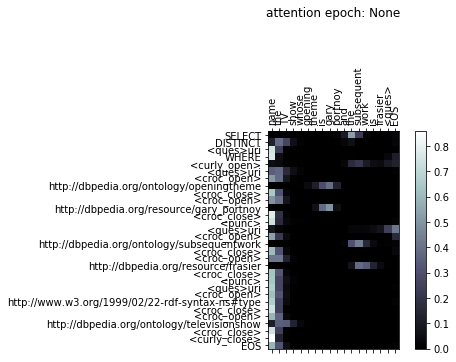

In [134]:
for i in range(1):
    _, out = eval_and_show(input_batch[:,i].unfold(0,1,1),Variable(torch.LongTensor([input_len[i]])), target_sentence=target_batch[:,i].unfold(0,1,1), target_len=Variable(torch.LongTensor([target_len[i]])) ,show = True)

### Translate

In [135]:
def translate(src_sent, lang, encoder, decoder, max_seq_len, show =  True):
    
    src_sen =src_sent.split()
    input_seqs = indexes_from_sentence(input_lang, src_sent)
    
    input_lengths = len(input_seqs)
    input_padded = [pad_seq(input_seqs, input_lengths, lang)]

    input_var = Variable(torch.LongTensor(input_padded)).transpose(0, 1)
    input_len = torch.LongTensor([input_lengths])
    _, out = eval_and_show(input_var,Variable(torch.LongTensor([input_len[0]])) ,show = show)
    return out

translating eng with 7597 entries to sparql with 4733 entries
> input-sentence: > how many movies is vangelis composer <ques> EOS




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/ontology/musiccomposer <croc_close> <croc_open> http://dbpedia.org/resource/mika_Hakkinen <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/film <croc_close> <curly_close> EOS




Writer not defined -- not writing to tensorboard


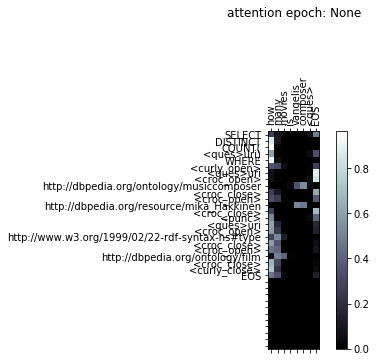

SELECT DISTINCT COUNT( ?uri) WHERE { ?uri <http://dbpedia.org/ontology/musiccomposer> <http://dbpedia.org/resource/mika_Hakkinen>. ?uri <http://www.w3.org/1999/02/22-rdf-syntax-ns#type> <http://dbpedia.org/ontology/film>} EOS


In [136]:
print('translating '+input_lang.name+' with '+str(input_lang.n_words)+' entries to '+output_lang.name+' with '+str(output_lang.n_words)+' entries')
s = 'list all the presidents of the school which had atleast one of the president as queen noor of jordan <ques>'
s1 = 'which comic characters are painted by bill finger <ques>'
s2 = "which hockey team is head coached by bill peters <ques>"
s3 = 'how many movies is vangelis composer <ques>'

out = translate(s3, input_lang, encoder, decoder, max_seq_len=MAX_LENGTH, show = True)

sparql_string = multi_replace(multi_remap_dict, out)
print(sparql_string)

###  Running Training 

Epoch:  1
Epoch:  2
Epoch:  3
Epoch:  4
Epoch:  5
0m 35s (- 589m 37s) (5 0%)
Epoch:  6
Epoch:  7
Epoch:  8
Epoch:  9
Epoch:  10
1m 10s (- 589m 38s) (10 0%)
Epoch:  11
Epoch:  12
Epoch:  13
Epoch:  14
Epoch:  15
1m 44s (- 579m 12s) (15 0%)
Epoch:  16
Epoch:  17
Epoch:  18
Epoch:  19
Epoch:  20
2m 17s (- 569m 57s) (20 0%)
torch.Size([22, 30])
tensor([ 22,  20,  18,  18,  18,  17,  17,  16,  15,  15,  14,  14,
         14,  13,  13,  13,  13,  13,  13,  12,  12,  11,  11,  11,
         11,  10,  10,  10,   8,   8])
> input-sentence: > name the scientist whose supervisor was john robert woodyard and has won norbert wiener award for social and professional responsibility <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/doctoraladvisor <croc_close> <croc_open> http://dbpedia.org/resource/john_robert_woodyard <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/prizes <croc_close> <croc_open> http:

> input-sentence: > name the office holder with predecessor as samuel W. mccall and office in massachusetts house of representatives <ques> EOS PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/predecessor <croc_close> <croc_open> http://dbpedia.org/resource/samuel_W._mccall <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/office <croc_close> <croc_open> http://dbpedia.org/resource/massachusetts_house_of_representatives <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/officeholder <croc_close> <curly_close> EOS




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> <croc_open> <croc_close> <croc_close> <croc_open> <croc_close> <ques>uri <punc> <croc_open> <croc_open> <croc_close> <croc_close> <ques>uri <curly_close> <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#typ

> input-sentence: > what are some video games whose music is composed by an employ of the company creatures <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/occupation <croc_close> <croc_open> http://dbpedia.org/resource/creatures_(company) <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/composer <croc_close> <ques>x <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/videogame <croc_close> <curly_close> EOS PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> <croc_close> <croc_close> <croc_open> <croc_close> <croc_close> <punc> <ques>x <croc_open> <croc_open> <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <curly_close> EOS




> inp

/usr/local/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch:  141
Epoch:  142
Epoch:  143
Epoch:  144
Epoch:  145
15m 55s (- 533m 9s) (145 2%)
Epoch:  146
Epoch:  147
Epoch:  148
Epoch:  149
Epoch:  150
16m 28s (- 532m 54s) (150 3%)
Epoch:  151
Epoch:  152
Epoch:  153
Epoch:  154
Epoch:  155
17m 9s (- 536m 16s) (155 3%)
Epoch:  156
Epoch:  157
Epoch:  158
Epoch:  159
Epoch:  160
17m 45s (- 536m 57s) (160 3%)
torch.Size([20, 30])
tensor([ 20,  19,  19,  18,  17,  16,  16,  16,  16,  15,  15,  15,
         14,  14,  14,  14,  14,  13,  12,  12,  11,  11,  10,  10,
          9,   9,   9,   8,   8,   7])
> input-sentence: > what is the debut team of the american football player who studied in north fort myers high school <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/highschool <croc_close> <croc_open> http://dbpedia.org/resource/north_fort_myers_high_school <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/debutteam <croc_close> <ques>uri <punc> 

> input-sentence: > which content license of the MSX BASIC is also the profession of the laura K. ipsen <ques> EOS PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/MSX_BASIC <croc_close> <croc_open> http://dbpedia.org/property/license <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/laura_K._ipsen <croc_close> <croc_open> http://dbpedia.org/ontology/occupation <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> <croc_open> <croc_close> <croc_open> <croc_open> <croc_close> <ques>uri. <ques>uri. <croc_open> <croc_open> <croc_close> <croc_open> http://dbpedia.org/ontology/country <croc_close> <ques>uri <curly_close> EOS




Epoch:  201
Epoch:  202
Epoch:  203
Epoch:  204
Epoch:  205
22m 41s (- 530m 48s) (205 4%)
Epoch:  206
Epoch:  207
Epoch:  208
Epoch:  209
Epoch:  210
23m 12s (- 529m 12s) (210 4%)
Epoch:  

> input-sentence: > what is the common affiliation of the monroe carell jr. children's hospital at vanderbilt and alma mater of the duncan U. fletcher <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/monroe_carell_jr._children's_hospital_at_vanderbilt <croc_close> <croc_open> http://dbpedia.org/property/affiliation <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/duncan_U._fletcher <croc_close> <croc_open> http://dbpedia.org/ontology/almamater <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/jose_maria_orellana <croc_close> <croc_open> http://dbpedia.org/property/almamater <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/cape_canaveral_air_force_station_space_launch_complex_17 <croc_close> <croc_open> http://dbpedia.org/ontology/almamater <croc_close> <q

> input-sentence: > name the scientist who was the winner of royal society award and had georg meissner as his doctoral advisor <ques> EOS PAD PAD PAD PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/prizes <croc_close> <croc_open> http://dbpedia.org/resource/royal_society <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/doctoraladvisor <croc_close> <croc_open> http://dbpedia.org/resource/georg_meissner <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/scientist <croc_close> <curly_close> EOS




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/ontology/academicadvisor <croc_close> <croc_open> http://dbpedia.org/resource/royal_society <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/academicadvisor <croc_close> <croc_open>

> input-sentence: > how many other awards have been given to people who have won the golden globe <ques> EOS PAD PAD




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/award <croc_close> <croc_open> http://dbpedia.org/resource/golden_globe_award <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/awards <croc_close> <ques>uri <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/award <croc_close> <curly_close> EOS PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/award <croc_close> <croc_open> http://dbpedia.org/ontology/award <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/award <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontolog

Epoch:  381
Epoch:  382
Epoch:  383
Epoch:  384
Epoch:  385
42m 47s (- 512m 57s) (385 7%)
Epoch:  386
Epoch:  387
Epoch:  388
Epoch:  389
Epoch:  390
43m 18s (- 511m 57s) (390 7%)
Epoch:  391
Epoch:  392
Epoch:  393
Epoch:  394
Epoch:  395
43m 52s (- 511m 32s) (395 7%)
Epoch:  396
Epoch:  397
Epoch:  398
Epoch:  399
Epoch:  400
44m 25s (- 510m 53s) (400 8%)
torch.Size([21, 30])
tensor([ 21,  20,  19,  18,  16,  16,  16,  15,  15,  15,  14,  14,
         14,  14,  14,  14,  14,  13,  13,  13,  12,  12,  12,  11,
         11,  10,  10,  10,   9,   8])
> input-sentence: > what is the name of the movie whose director of photography was jordan cronenweth and music composer was vangelis <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/cinematography <croc_close> <croc_open> http://dbpedia.org/resource/jordan_cronenweth <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/musiccomposer <croc_close>

> input-sentence: > who was the bronze medalist of swimming at the 2008 summer olympics men's 400 metre individual medley <ques> EOS PAD PAD PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/swimming_at_the_2008_summer_olympics_–_men's_400_metre_individual_medley <croc_close> <croc_open> http://dbpedia.org/ontology/bronzemedalist <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/viveka_babajee <croc_close> <croc_open> http://dbpedia.org/ontology/city <croc_close> <ques>uri <curly_close> EOS




> input-sentence: > who were in the youth clubs that were in season of 2015 argentine primera division <ques> EOS PAD PAD PAD PAD PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/season <croc_close

> input-sentence: > what are the other key people of the non-profit organisations whose one of the key person is joe green <ques> EOS PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/keypeople <croc_close> <croc_open> http://dbpedia.org/resource/joe_green_(entrepreneur) <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/keypeople <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/non-profitorganisation <croc_close> <curly_close> EOS PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/keypeople <croc_close> <croc_open> http://dbpedia.org/property/keypeople <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/keypeople <croc_close> <ques>uri <punc> <curly_close> EOS




Epoch:  481
Epoch:  482
Epoch:  483
Epoch:  484


Epoch:  521
Epoch:  522
Epoch:  523
Epoch:  524
Epoch:  525
58m 35s (- 499m 27s) (525 10%)
Epoch:  526
Epoch:  527
Epoch:  528
Epoch:  529
Epoch:  530
59m 8s (- 498m 48s) (530 10%)
Epoch:  531
Epoch:  532
Epoch:  533
Epoch:  534
Epoch:  535
59m 41s (- 498m 13s) (535 10%)
Epoch:  536
Epoch:  537
Epoch:  538
Epoch:  539
Epoch:  540
60m 18s (- 498m 5s) (540 10%)
torch.Size([20, 30])
tensor([ 20,  19,  18,  18,  18,  17,  17,  16,  16,  16,  15,  15,
         15,  14,  14,  14,  13,  12,  12,  12,  12,  12,  11,  11,
         11,   9,   9,   9,   9,   8])
> input-sentence: > which relative of george madison was the leader of united states house of representatives elections, 1788 and 1789 <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/george_madison <croc_close> <croc_open> http://dbpedia.org/ontology/relation <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/united_states_house_of_representatives_elections

> input-sentence: > give me the total number of employer of the engineers whose one of the employer is mcdonnell aircraft <ques> EOS PAD




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/employer <croc_close> <croc_open> http://dbpedia.org/resource/mcdonnell_aircraft <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/employer <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/manager <croc_close> <croc_open> http://dbpedia.org/resource/tetsugen_bernard_glassman <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/maininterests <croc_close> <ques>uri <curly_close> EOS




> input-sentence: > which office holder's resting place is alta mesa memorial park and has adrian A. basora as successor <ques> EOS PAD PAD




=target-sentence= SELE

> input-sentence: > who started at the pole position in both 1997 canadian grand prix and the 94 spanish one <ques> EOS PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/1997_canadian_grand_prix <croc_close> <croc_open> http://dbpedia.org/property/poledriver <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/1994_spanish_grand_prix <croc_close> <croc_open> http://dbpedia.org/property/poledriver <croc_close> <ques>uri <punc> <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/1997_canadian_grand_prix <croc_close> <croc_open> http://dbpedia.org/ontology/tenant <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/1994_spanish_grand_prix <croc_close> <croc_open> http://dbpedia.org/ontology/tenant <croc_close> <ques>uri <punc> <curly_close> EOS




Epoch:  621
Epoch:  622
Epoch:  623
Epoch:  624
Ep

Epoch:  661
Epoch:  662
Epoch:  663
Epoch:  664
Epoch:  665
74m 25s (- 485m 6s) (665 13%)
Epoch:  666
Epoch:  667
Epoch:  668
Epoch:  669
Epoch:  670
74m 57s (- 484m 23s) (670 13%)
Epoch:  671
Epoch:  672
Epoch:  673
Epoch:  674
Epoch:  675
75m 30s (- 483m 46s) (675 13%)
Epoch:  676
Epoch:  677
Epoch:  678
Epoch:  679
Epoch:  680
76m 2s (- 483m 4s) (680 13%)
torch.Size([22, 30])
tensor([ 22,  21,  21,  17,  17,  17,  17,  16,  16,  16,  15,  15,
         15,  15,  14,  14,  13,  13,  13,  13,  12,  12,  12,  12,
         11,  10,  10,  10,   7,   6])
> input-sentence: > which serving railway line of the daund junction railway station was also the place where 99 (2009 film) was recorded <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/daund_junction_railway_station <croc_close> <croc_open> http://dbpedia.org/ontology/servingrailwayline <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/99_(2009_film) <croc

> input-sentence: > count the number teams which have former ice hockey players which also included american hockey league <ques> EOS




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/formerteam <croc_close> <croc_open> http://dbpedia.org/resource/american_hockey_league <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/formerteam <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/position <croc_close> <croc_open> http://dbpedia.org/resource/national_hockey_league <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/team <croc_close> <ques>uri <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/icehockeyplayer <croc_close> <curly_close> EOS




> input-sente

> input-sentence: > count the number of characters of the play whose one of the character is catwoman <ques> EOS PAD PAD PAD PAD




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/characters <croc_close> <croc_open> http://dbpedia.org/resource/catwoman <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/characters <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/writers <croc_close> <croc_open> http://dbpedia.org/resource/michael_cristofer <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/licensee <croc_close> <ques>uri <curly_close> EOS




Epoch:  761
Epoch:  762
Epoch:  763
Epoch:  764
Epoch:  765
85m 42s (- 474m 26s) (765 15%)
Epoch:  766
Epoch:  767
Epoch:  768
Epoch:  769
Epoch:  770
86m 16s (- 473m 56s) (770 15%)
Epoch:  771

Epoch:  801
Epoch:  802
Epoch:  803
Epoch:  804
Epoch:  805
90m 24s (- 471m 5s) (805 16%)
Epoch:  806
Epoch:  807
Epoch:  808
Epoch:  809
Epoch:  810
90m 56s (- 470m 25s) (810 16%)
Epoch:  811
Epoch:  812
Epoch:  813
Epoch:  814
Epoch:  815
91m 29s (- 469m 48s) (815 16%)
Epoch:  816
Epoch:  817
Epoch:  818
Epoch:  819
Epoch:  820
92m 3s (- 469m 17s) (820 16%)
torch.Size([17, 30])
tensor([ 17,  17,  16,  16,  16,  14,  14,  13,  13,  13,  13,  13,
         12,  12,  12,  12,  11,  11,  11,  11,  11,  11,  10,  10,
         10,   9,   9,   9,   8,   7])
> input-sentence: > what has been founded in the state that denton county, texas is a part of <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/part <croc_close> <croc_open> http://dbpedia.org/resource/denton_county,_texas <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/foundationplace <croc_close> <ques>x <punc> <curly_close> EOS PAD PAD PAD

> input-sentence: > what is the religion of the ethnic group to which the relatives of waxiang people belong <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/waxiang_people <croc_close> <croc_open> http://dbpedia.org/property/related <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/ontology/religion <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/ethnicgroup <croc_close> <curly_close> EOS PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/clara_ng <croc_close> <croc_open> http://dbpedia.org/ontology/relative <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/ontology/religion <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > which cities were in the TV show which came after the ultimate fighter: b

Epoch:  901
Epoch:  902
Epoch:  903
Epoch:  904
Epoch:  905
102m 39s (- 464m 30s) (905 18%)
Epoch:  906
Epoch:  907
Epoch:  908
Epoch:  909
Epoch:  910
103m 16s (- 464m 9s) (910 18%)
Epoch:  911
Epoch:  912
Epoch:  913
Epoch:  914
Epoch:  915
103m 50s (- 463m 35s) (915 18%)
Epoch:  916
Epoch:  917
Epoch:  918
Epoch:  919
Epoch:  920
104m 32s (- 463m 38s) (920 18%)
torch.Size([21, 30])
tensor([ 21,  19,  17,  16,  15,  15,  14,  14,  14,  13,  13,  13,
         13,  13,  12,  12,  12,  12,  12,  12,  11,  11,  10,  10,
         10,   9,   9,   9,   9,   8])
> input-sentence: > what is common between sports played at fr agnel school and jr college, and the genre of virtual kasparov <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/virtual_kasparov <croc_close> <croc_open> http://dbpedia.org/ontology/genre <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/fr._agnel_multipurpose_school_and_junior_college <cro

> input-sentence: > what cities does the river goes through, whose tributary is the little black river in arkansas <ques> EOS PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/lefttributary <croc_close> <croc_open> http://dbpedia.org/resource/little_black_river_(missouri_-_arkansas) <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/city <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/river <croc_close> <curly_close> EOS PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/mouthmountain <croc_close> <croc_open> http://dbpedia.org/resource/igor_shpillband <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/city <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > which content license of the 

Epoch:  1001
Epoch:  1002
Epoch:  1003
Epoch:  1004
Epoch:  1005
115m 25s (- 458m 51s) (1005 20%)
Epoch:  1006
Epoch:  1007
Epoch:  1008
Epoch:  1009
Epoch:  1010
116m 0s (- 458m 17s) (1010 20%)
Epoch:  1011
Epoch:  1012
Epoch:  1013
Epoch:  1014
Epoch:  1015
116m 33s (- 457m 36s) (1015 20%)
Epoch:  1016
Epoch:  1017
Epoch:  1018
Epoch:  1019
Epoch:  1020
117m 6s (- 456m 57s) (1020 20%)
torch.Size([18, 30])
tensor([ 18,  18,  17,  17,  17,  16,  15,  15,  14,  14,  13,  13,
         13,  13,  13,  13,  12,  12,  12,  11,  10,  10,   9,   9,
          8,   8,   8,   8,   7,   7])
> input-sentence: > list the awards won by the fashion designer which have been recognized by tennessee state museum <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/award <croc_close> <croc_open> http://dbpedia.org/resource/tennessee_state_museum <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/award <croc_close> <q

> input-sentence: > give the distinct number of other party of the people which have one of the party as janata party <ques> EOS




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/otherparty <croc_close> <croc_open> http://dbpedia.org/resource/janata_party <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/otherparty <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/party <croc_close> <croc_open> http://dbpedia.org/resource/laurence_mark <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/hometown <croc_close> <ques>uri <curly_close> EOS




> input-sentence: > what are the other key people of the non-profit organisations whose one of the key person is joe green <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_

Epoch:  1101
Epoch:  1102
Epoch:  1103
Epoch:  1104
Epoch:  1105
127m 3s (- 447m 52s) (1105 22%)
Epoch:  1106
Epoch:  1107
Epoch:  1108
Epoch:  1109
Epoch:  1110
127m 37s (- 447m 14s) (1110 22%)
Epoch:  1111
Epoch:  1112
Epoch:  1113
Epoch:  1114
Epoch:  1115
128m 10s (- 446m 36s) (1115 22%)
Epoch:  1116
Epoch:  1117
Epoch:  1118
Epoch:  1119
Epoch:  1120
128m 44s (- 445m 58s) (1120 22%)
torch.Size([23, 30])
tensor([ 23,  21,  18,  17,  17,  17,  16,  15,  15,  14,  14,  13,
         13,  13,  13,  12,  12,  12,  11,  11,  11,  11,  11,   9,
          9,   9,   8,   8,   7,   7])
> input-sentence: > give me all commanders which had an important role in both, the battle of fort stephenson and battle of the thames <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/battle_of_fort_stephenson <croc_close> <croc_open> http://dbpedia.org/ontology/commander <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/battle_

> input-sentence: > what is the local authority of the trinity school, brentwood and place of birth of the sarah walker (badminton) <ques> EOS PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/trinity_school,_brentwood <croc_close> <croc_open> http://dbpedia.org/ontology/localauthority <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/sarah_walker_(badminton) <croc_close> <croc_open> http://dbpedia.org/property/placeofbirth <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/trinity_school,_brentwood <croc_close> <croc_open> http://dbpedia.org/property/album <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/nina_vislova <croc_close> <croc_open> http://dbpedia.org/property/placeofbirth <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > what is the

> input-sentence: > count the total number of software whose programming language is C++ and operating system is microsoft windows <ques> EOS PAD




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/programminglanguage <croc_close> <croc_open> http://dbpedia.org/resource/C++ <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/operatingsystem <croc_close> <croc_open> http://dbpedia.org/resource/microsoft_windows <croc_close> <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/ontology/programminglanguage <croc_close> <croc_open> http://dbpedia.org/resource/C++ <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/operatingsystem <croc_close> <croc_open> http://dbpedia.org/resource/microsoft_windows <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-

Epoch:  1241
Epoch:  1242
Epoch:  1243
Epoch:  1244
Epoch:  1245
142m 55s (- 431m 3s) (1245 24%)
Epoch:  1246
Epoch:  1247
Epoch:  1248
Epoch:  1249
Epoch:  1250
143m 32s (- 430m 36s) (1250 25%)
Epoch:  1251
Epoch:  1252
Epoch:  1253
Epoch:  1254
Epoch:  1255
144m 11s (- 430m 16s) (1255 25%)
Epoch:  1256
Epoch:  1257
Epoch:  1258
Epoch:  1259
Epoch:  1260
144m 52s (- 430m 1s) (1260 25%)
torch.Size([24, 30])
tensor([ 24,  21,  18,  17,  16,  15,  15,  14,  14,  14,  14,  14,
         13,  13,  13,  12,  12,  12,  12,  11,  11,  11,  11,  11,
         10,  10,  10,   9,   8,   7])
> input-sentence: > name the company whose one of the product is pixar image computer and has one of the key person as edwin catmull <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/ontology/product <croc_close> <croc_open> http://dbpedia.org/resource/pixar_image_computer <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/k

> input-sentence: > what is the name of the movie whose director of photography was jordan cronenweth and music composer was vangelis <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/cinematography <croc_close> <croc_open> http://dbpedia.org/resource/jordan_cronenweth <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/musiccomposer <croc_close> <croc_open> http://dbpedia.org/resource/vangelis <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/film <croc_close> <curly_close> EOS




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/ontology/cinematography <croc_close> <croc_open> http://dbpedia.org/resource/jordan_cronenweth <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontology/cinematography <croc_close> <croc_open> http://dbped

> input-sentence: > how many other guests are there of the television episodes whose guests is brian d'arcy james <ques> EOS PAD




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/guests <croc_close> <croc_open> http://dbpedia.org/resource/brian_d'arcy_james <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/guests <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/lefttributary <croc_close> <croc_open> http://dbpedia.org/resource/instagram <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/guests <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > what is the headquarters of the public transit system which is the section of red ahead <ques> EOS PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open

> input-sentence: > what is the headquarters of the public transit system which is the section of red ahead <ques> EOS PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/red_ahead <croc_close> <croc_open> http://dbpedia.org/ontology/ispartof <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/property/headquarters <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/publictransitsystem <croc_close> <curly_close> EOS PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/robbie_diack <croc_close> <croc_open> http://dbpedia.org/ontology/narrator <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/property/headquarters <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> htt

> input-sentence: > what are some common games played at both fr agnel multipurpose school and vishwajyot high school <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/fr._agnel_multipurpose_school_and_junior_college <croc_close> <croc_open> http://dbpedia.org/ontology/sport <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/vishwajyot_high_school <croc_close> <croc_open> http://dbpedia.org/ontology/sport <croc_close> <ques>uri <punc> <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/almamater <croc_close> <croc_open> http://dbpedia.org/resource/national_film_school_in_Łodz <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/sport <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > what are some common games played at both fr agnel multipurpose school and 

> input-sentence: > name the office holder with predecessor as samuel W. mccall and office in massachusetts house of representatives <ques> EOS PAD PAD PAD PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/predecessor <croc_close> <croc_open> http://dbpedia.org/resource/samuel_W._mccall <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/office <croc_close> <croc_open> http://dbpedia.org/resource/massachusetts_house_of_representatives <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/officeholder <croc_close> <curly_close> EOS




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/predecessor <croc_close> <croc_open> http://dbpedia.org/resource/ralf_schumacher <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/office <cro

Epoch:  1521
Epoch:  1522
Epoch:  1523
Epoch:  1524
Epoch:  1525
178m 27s (- 406m 40s) (1525 30%)
Epoch:  1526
Epoch:  1527
Epoch:  1528
Epoch:  1529
Epoch:  1530
179m 7s (- 406m 14s) (1530 30%)
Epoch:  1531
Epoch:  1532
Epoch:  1533
Epoch:  1534
Epoch:  1535
179m 45s (- 405m 45s) (1535 30%)
Epoch:  1536
Epoch:  1537
Epoch:  1538
Epoch:  1539
Epoch:  1540
180m 20s (- 405m 10s) (1540 30%)
torch.Size([19, 30])
tensor([ 19,  18,  17,  17,  16,  16,  15,  15,  13,  13,  13,  13,
         12,  11,  11,  10,  10,  10,  10,  10,  10,   9,   9,   9,
          9,   9,   8,   8,   8,   7])
> input-sentence: > list the pole drivers in the grand prixes where williams grand prix engineering was a first team <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/firstteam <croc_close> <croc_open> http://dbpedia.org/resource/williams_grand_prix_engineering <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/poledri

> input-sentence: > how many other characters are there of the plays which has a characters name joker (comics) <ques> EOS PAD




=target-sentence= SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/characters <croc_close> <croc_open> http://dbpedia.org/resource/joker_(comics) <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/characters <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT COUNT( <ques>uri) WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/starring <croc_close> <croc_open> http://dbpedia.org/resource/michigan_wolverines <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/starring <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > which publisher of stone canoe is also the university for which michael powell plays for <ques> EOS PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curl

Epoch:  1621
Epoch:  1622
Epoch:  1623
Epoch:  1624
Epoch:  1625
191m 20s (- 397m 23s) (1625 32%)
Epoch:  1626
Epoch:  1627
Epoch:  1628
Epoch:  1629
Epoch:  1630
192m 0s (- 396m 59s) (1630 32%)
Epoch:  1631
Epoch:  1632
Epoch:  1633
Epoch:  1634
Epoch:  1635
192m 39s (- 396m 30s) (1635 32%)
Epoch:  1636
Epoch:  1637
Epoch:  1638
Epoch:  1639
Epoch:  1640
193m 17s (- 396m 0s) (1640 32%)
torch.Size([22, 30])
tensor([ 22,  18,  18,  17,  17,  17,  17,  16,  15,  15,  15,  15,
         14,  14,  13,  13,  13,  13,  12,  12,  11,  11,  11,  11,
         10,  10,  10,  10,   8,   8])
> input-sentence: > which serving railway line of the daund junction railway station was also the place where 99 (2009 film) was recorded <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/daund_junction_railway_station <croc_close> <croc_open> http://dbpedia.org/ontology/servingrailwayline <croc_close> <ques>uri. <croc_open> http://dbpedia.org/

> input-sentence: > what is the series of the book which is a subsequent work of blade runner 2: the edge of human <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/blade_runner_2:_the_edge_of_human <croc_close> <croc_open> http://dbpedia.org/ontology/subsequentwork <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/ontology/series <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/book <croc_close> <curly_close> EOS PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/ontology/location <croc_close> <croc_open> http://dbpedia.org/resource/william_luther_hill <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/ontology/series <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > name the military unit whose garrison is 

> input-sentence: > what is the official residence of the lula J. davis which is also the death location of the john mctaggart (jockey) <ques> EOS PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/lula_J._davis <croc_close> <croc_open> http://dbpedia.org/ontology/residence <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/john_mctaggart_(jockey) <croc_close> <croc_open> http://dbpedia.org/ontology/deathplace <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/christopher_Diaz_figueroa <croc_close> <croc_open> http://dbpedia.org/property/origin <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/tommy_tucker's_tooth <croc_close> <croc_open> http://dbpedia.org/property/deathplace <croc_close> <ques>uri <curly_close> EOS




> input-sentence: > how many other characters a

Epoch:  1761
Epoch:  1762
Epoch:  1763
Epoch:  1764
Epoch:  1765
211m 39s (- 387m 57s) (1765 35%)
Epoch:  1766
Epoch:  1767
Epoch:  1768
Epoch:  1769
Epoch:  1770
212m 23s (- 387m 35s) (1770 35%)
Epoch:  1771
Epoch:  1772
Epoch:  1773
Epoch:  1774
Epoch:  1775
213m 8s (- 387m 14s) (1775 35%)
Epoch:  1776
Epoch:  1777
Epoch:  1778
Epoch:  1779
Epoch:  1780
213m 53s (- 386m 56s) (1780 35%)
torch.Size([20, 30])
tensor([ 20,  18,  18,  17,  17,  16,  15,  15,  15,  14,  14,  13,
         13,  13,  12,  12,  12,  11,  11,  11,  10,  10,  10,  10,
          9,   9,   9,   8,   8,   6])
> input-sentence: > what city in the US was alfred phillips born in, and is the resting place of william smith <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/william_H._smith_(connecticut) <croc_close> <croc_open> http://dbpedia.org/ontology/restingplace <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/alfred_N._phillips <cro

Epoch:  1807
Epoch:  1808
Epoch:  1809
Epoch:  1810
218m 51s (- 385m 43s) (1810 36%)
Epoch:  1811
Epoch:  1812
Epoch:  1813
Epoch:  1814
Epoch:  1815
219m 35s (- 385m 21s) (1815 36%)
Epoch:  1816
Epoch:  1817
Epoch:  1818
Epoch:  1819
Epoch:  1820
220m 22s (- 385m 3s) (1820 36%)
torch.Size([22, 30])
tensor([ 22,  22,  21,  21,  19,  19,  18,  18,  18,  18,  18,  17,
         16,  16,  15,  15,  15,  14,  14,  12,  12,  12,  11,   9,
          9,   8,   8,   8,   8,   7])
> input-sentence: > name a scientist whose official residence is cape town and also won a gold medal at the royal astronomical society <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/prizes <croc_close> <croc_open> http://dbpedia.org/resource/gold_medal_of_the_royal_astronomical_society <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/residence <croc_close> <croc_open> http://dbpedia.org/resource/cape_town <croc_close> 

> input-sentence: > what is the largest city of the country to whom, the battle honours of 65th regiment of foot were given <ques> EOS PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/65th_(2nd_yorkshire,_north_riding)_regiment_of_foot <croc_close> <croc_open> http://dbpedia.org/property/battlehonours <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/ontology/largestcity <croc_close> <ques>uri <punc> <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/pat_kirkwood_(racing_driver) <croc_close> <croc_open> http://dbpedia.org/ontology/successor <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/ontology/largestcity <croc_close> <ques>uri <punc> <curly_close> EOS




> input-sentence: > how many factions have fought in wars where francois marie le marchand de lignery was involved <qu

Epoch:  1901
Epoch:  1902
Epoch:  1903
Epoch:  1904
Epoch:  1905
233m 24s (- 379m 12s) (1905 38%)
Epoch:  1906
Epoch:  1907
Epoch:  1908
Epoch:  1909
Epoch:  1910
234m 4s (- 378m 41s) (1910 38%)
Epoch:  1911
Epoch:  1912
Epoch:  1913
Epoch:  1914
Epoch:  1915
234m 48s (- 378m 15s) (1915 38%)
Epoch:  1916
Epoch:  1917
Epoch:  1918
Epoch:  1919
Epoch:  1920
235m 31s (- 377m 49s) (1920 38%)
torch.Size([19, 30])
tensor([ 19,  18,  17,  17,  16,  16,  15,  15,  14,  14,  14,  14,
         14,  14,  13,  13,  13,  12,  12,  12,  11,  11,  11,  10,
         10,   9,   9,   9,   9,   9])
> input-sentence: > what is the name of the artist which worked on the subsequent work of ella loves cole <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/ella_loves_cole <croc_close> <croc_open> http://dbpedia.org/ontology/subsequentwork <croc_close> <ques>x <punc> <ques>x <croc_open> http://dbpedia.org/property/artist <croc_close> <ques>uri

> input-sentence: > name the basketball team which is coached by louis dunbar and has president as jeff munn <ques> EOS PAD PAD PAD




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/coach <croc_close> <croc_open> http://dbpedia.org/resource/louis_dunbar <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/president <croc_close> <croc_open> http://dbpedia.org/resource/jeff_munn <croc_close> <punc> <ques>uri <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/basketballteam <croc_close> <curly_close> EOS




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/coach <croc_close> <croc_open> http://dbpedia.org/resource/louis_dunbar <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/property/president <croc_close> <croc_open> http://dbpedia.org/resource/stan_van_gundy <croc_cl

Epoch:  2001
Epoch:  2002
Epoch:  2003
Epoch:  2004
Epoch:  2005
248m 25s (- 371m 5s) (2005 40%)
Epoch:  2006
Epoch:  2007
Epoch:  2008
Epoch:  2009
Epoch:  2010
249m 9s (- 370m 38s) (2010 40%)
Epoch:  2011
Epoch:  2012
Epoch:  2013
Epoch:  2014
Epoch:  2015
249m 54s (- 370m 12s) (2015 40%)
Epoch:  2016
Epoch:  2017
Epoch:  2018
Epoch:  2019
Epoch:  2020
250m 38s (- 369m 46s) (2020 40%)
torch.Size([18, 30])
tensor([ 18,  16,  16,  16,  16,  16,  15,  15,  14,  13,  13,  13,
         13,  13,  12,  12,  11,  11,  10,  10,  10,  10,  10,   9,
          9,   9,   9,   9,   7,   6])
> input-sentence: > Which region of the providence chapel, charlwood is also the region of the joseph case high school EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/providence_chapel,_charlwood <croc_close> <croc_open> http://dbpedia.org/property/style <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/joseph_case_high_school <croc_cl

> input-sentence: > name the team for which hensley meulens played, whihc was also the debut team od steve ontiveros <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/steve_ontiveros_(infielder) <croc_close> <croc_open> http://dbpedia.org/property/debutteam <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/hensley_meulens <croc_close> <croc_open> http://dbpedia.org/ontology/team <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/jim_sasser <croc_close> <croc_open> http://dbpedia.org/ontology/debutteam <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/judson_huss <croc_close> <croc_open> http://dbpedia.org/property/debutteam <croc_close> <ques>uri <curly_close> EOS




> input-sentence: > what are some common games played at both fr agnel multipurpose school a

Epoch:  2101
Epoch:  2102
Epoch:  2103
Epoch:  2104
Epoch:  2105
263m 2s (- 361m 45s) (2105 42%)
Epoch:  2106
Epoch:  2107
Epoch:  2108
Epoch:  2109
Epoch:  2110
263m 42s (- 361m 12s) (2110 42%)
Epoch:  2111
Epoch:  2112
Epoch:  2113
Epoch:  2114
Epoch:  2115
264m 26s (- 360m 43s) (2115 42%)
Epoch:  2116
Epoch:  2117
Epoch:  2118
Epoch:  2119
Epoch:  2120
265m 6s (- 360m 9s) (2120 42%)
torch.Size([21, 30])
tensor([ 21,  21,  19,  17,  17,  16,  15,  14,  14,  13,  13,  13,
         13,  13,  12,  12,  12,  12,  11,  11,  11,  11,  10,  10,
          9,   8,   8,   8,   8,   7])
> input-sentence: > what is the name of the movie whose director of photography was jordan cronenweth and music composer was vangelis <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>uri <croc_open> http://dbpedia.org/property/cinematography <croc_close> <croc_open> http://dbpedia.org/resource/jordan_cronenweth <croc_close> <punc> <ques>uri <croc_open> http://dbpedia.org/ontolo

Epoch:  2152
Epoch:  2153
Epoch:  2154
Epoch:  2155
270m 31s (- 357m 8s) (2155 43%)
Epoch:  2156
Epoch:  2157
Epoch:  2158
Epoch:  2159
Epoch:  2160
271m 14s (- 356m 38s) (2160 43%)
torch.Size([23, 30])
tensor([ 23,  19,  18,  18,  17,  16,  16,  16,  15,  15,  15,  15,
         15,  14,  14,  14,  14,  11,  11,  11,  10,   9,   8,   8,
          8,   8,   7,   7,   7,   6])
> input-sentence: > what is the profession of the chris myers (new jersey) which is the governing body of oahu railway and land company <ques> EOS




=target-sentence= SELECT DISTINCT <ques>uri WHERE <curly_open> <croc_open> http://dbpedia.org/resource/chris_myers_(new_jersey) <croc_close> <croc_open> http://dbpedia.org/ontology/profession <croc_close> <ques>uri. <croc_open> http://dbpedia.org/resource/oahu_railway_and_land_company <croc_close> <croc_open> http://dbpedia.org/property/governingbody <croc_close> <ques>uri <curly_close> EOS PAD PAD PAD PAD PAD PAD PAD PAD PAD




< output-sentence < SELECT DISTINCT <

KeyboardInterrupt: 

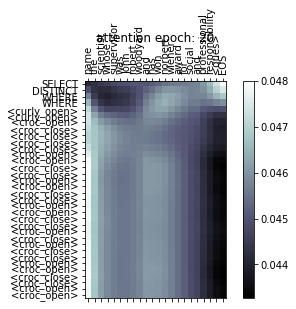

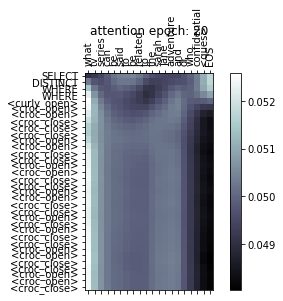

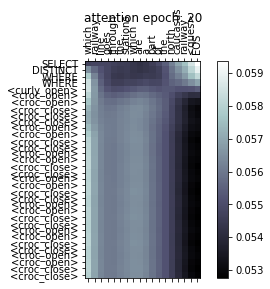

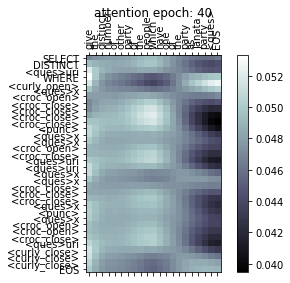

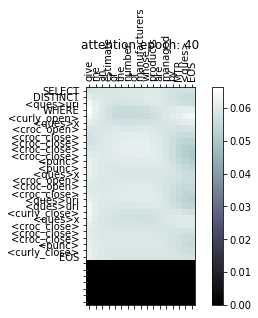

...

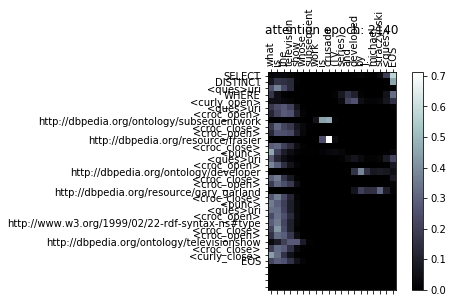

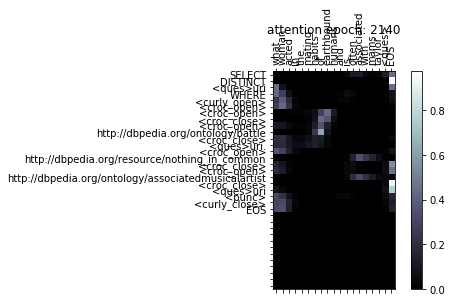

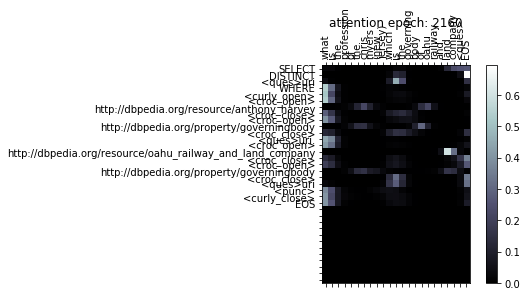

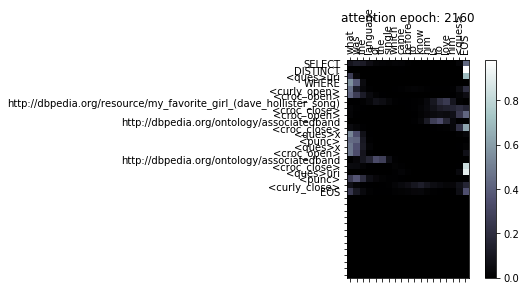

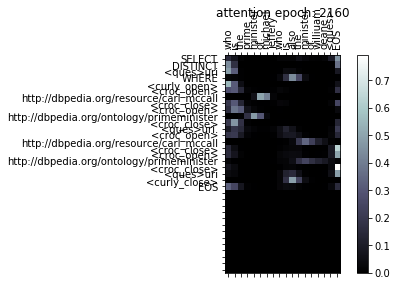

In [46]:
encoderClipAvg = 0
decoderClipAvg = 0
total_loss = 0 
total_corrects = 0
total_words = 0

total_loss_eval = 0
total_corrects_eval = 0
total_words_eval = 0


start = time.time()
epoch = optTraining.epoch
n_epochs = optTraining.nEpochs

writer = SummaryWriter()

while epoch < n_epochs:
    epoch += 1
    print('Epoch: ', epoch)
    
    #get batch of data
    input_batch, input_len, target_batch, target_len = random_batch(optTraining.batch_size, pairs, input_lang, output_lang)
    #run train func
    loss, pred_seqs, num_corrects, num_words, ec, dc, decoder_attn = train(input_batch, input_len, target_batch, target_len, encoder, decoder, encoder_opti, decoder_opti, batch_size = optTraining.batch_size, clip = optTraining.clip)
    
    #keep track
    total_loss += loss
    encoderClipAvg += ec
    decoderClipAvg += dc
    
    total_corrects += num_corrects
    total_words += num_words.item()
    total_accuracy = 100 * (total_corrects / total_words)    
    

    
    if epoch % optTraining.printEvery == 0:
        
        s = '%s (%d %d%%)' % (time_since(start, epoch / n_epochs), epoch, epoch / n_epochs * 100)
        print(s)
        
    if epoch % optTraining.saveTrainingStatsEvery == 0:
        
        writer.add_scalar('loss', loss, epoch)
        writer.add_scalar('total_loss',total_loss,epoch)
        writer.add_scalar('total_acc', total_accuracy)
        
        writer.add_scalar('total_corrects', total_corrects, epoch)
        writer.add_scalar('total_words', total_words, epoch)
        
        writer.add_scalar('ec', ec, epoch)
        writer.add_scalar('dc', dc, epoch)

        total_loss = 0
        total_corrects = 0
        total_words = 0

    
    if epoch % optTraining.evaluateEvery == 0:
        # evaluation on evaluation set
        input_batch_eval, input_len_eval, target_batch_eval, target_len_eval = random_batch(optTraining.evalBatchSize, pairs_val, input_lang, output_lang)
        loss_eval, pred_seqs_eval, num_corrects_eval, num_words_eval, decoder_attn = evaluate(input_batch_eval, input_len_eval, target_batch_eval, target_len_eval, encoder, decoder, batch_size = optTraining.evalBatchSize)
        
        
        total_loss_eval += loss_eval
        total_corrects_eval += num_corrects_eval
        total_words_eval += num_words_eval.item()
        total_accuracy_eval = 100 * (total_corrects_eval  / total_words_eval)
        
        #print and show for a certain amount of batch
        ra = int(optTraining.evalBatchSize * 0.1)
        if ra < 1:
            ra = 1
        bleu_scores = []
        for i in range(ra):
            bleu_score = eval_and_show(input_batch_eval[:,i].unfold(0,1,1),Variable(torch.LongTensor([input_len_eval[i]])), target_sentence=target_batch_eval[:,i].unfold(0,1,1), target_len=Variable(torch.LongTensor([target_len_eval[i]])) , epoch = epoch, show = True)
            bleu_scores.append(bleu_score)
            
        bleu_scores = np.mean(bleu_scores)
        
        writer.add_scalar('loss', loss_eval, epoch)
        writer.add_scalar('total_loss_eval', total_loss_eval, epoch)
        writer.add_scalar('total_corrects_eval', total_corrects_eval, epoch)
        writer.add_scalar('total_words_eval', total_words_eval, epoch)
        writer.add_scalar('total_accuracy_eval', total_accuracy_eval, epoch)
        writer.add_scalar('bleu_scores', bleu_scores, epoch)

        total_loss_eval = 0
        total_corrects_eval = 0
        total_words_eval = 0
        
    if epoch % optTraining.plotEmbeddingEvery == 0:
        
        writer.add_embedding(encoder.embedding.weight, metadata=input_lang.word2index.keys(), tag='encoder', global_step=epoch)
        writer.add_embedding(decoder.embedding.weight, metadata=output_lang.word2index.keys(),tag='decoder', global_step=epoch)

    
    if epoch % optTraining.saveEvery == 0:
        t = time.time()
        path_encoder = 'encoder_epoch_'+str(epoch)+'_timestamp_'+str(t)
        torch.save(encoder.state_dict(), path_encoder)
        path_decoder = 'decoder_epoch_'+str(epoch)+'_timestamp_'+str(t)
        torch.save(decoder.state_dict(), path_decoder)
        path_opti_encoder = 'encoder_opti_epoch_'+str(epoch)+'_timestamp_'+str(t)
        torch.save(encoder_opti.state_dict(), path_opti_encoder)
        path_opti_decoder = 'decoder_opti_epoch_'+str(epoch)+'_timestamp_'+str(t)
        torch.save(decoder_opti.state_dict(), path_opti_decoder)

    writer.add_scalar('general_loss', loss, epoch)

writer.close()

# Reinforced Training

In [ ]:
#pretrained from above !!
actor = objdict()
actor.encoder = encoder
actor.decoder = decoder

In [ ]:
actor = (encoder, decoder)
critic = ?
update_critic = True
update_actor = True
def reinforce_train(input_batches, input_lengths, target_batches, target_lengths, actor, critic, encoder_optimizer, decoder_optimizer, criterion, batch_size, clip, max_length=MAX_LENGTH, word2index = True):
    
    actor.encoder.zero_grad()
    actor.decoder.zero_grad()
    critic.zero_grad()
    
    
    #run through actor = EncoderDecoder
    encoder_outputs, encoder_hidden = actor.encoder(input_batches, input_lengths, None)
    if word2index:
        decoder_input = Variable(torch.LongTensor([output_lang.word2index[SOS_token]] * batch_size))
    decoder_hidden = encoder_hidden[:actor.decoder.layers]

    if DEVICE == 'gpu':
        decoder_input = decoder_input.cuda()
        
    decoded_word = []
    decoder_attentions = torch.zeros(max_length +1, max_length + 1)
    
    for di in range(max_length):
        decoder_output, decoder_hidden, decoder_attention = actor.decoder(
            decoder_input, decoder_hidden, encoder_outputs
        )
        decoder_attentions[di,:decoder_attention.siez(2)] += decoder_attention.squeeze(0).squeeze(0).cpu().data
        
        print('decoder_output',decoder_output)
        topv, topi = decoder_output.data.topk(1)
        ni = topi[0][0]
        if word2index:
            EOS_INDEX = output_lang.word2index['EOS']
        int_ni = (int(ni))
        if in_ni == EOS_INDEX
            print('EOSINDEX')
            decoded_words.append(EOS_token)
            break
        else:
            print('dw',decoded_words)
            decoded_words.append(output_lanf.index2word[int_ni])
        
        # Next input is chosen word
        decoder_input = Variable(torch.LongTensor([ni]))
        if DEVICE == 'gpu': decoder_input = decoder_input.cuda()
     
    rewards, samples = sent_reward_func(decoded_words, target_batches) #.t().tolist()
    reward = sum(rewards)
    print('reward',reward)
    
    samples = Variable(torch.LongTensor(samples).t().contiguous())
    rewards = Variable(torch.FloatTensor([rewards] * samples.size(0)).contiguous())
    
    if DEVICE == 'gpu':
        samples = samples.cuda()
        rewards = rewards.cuda()
        
    #update Critic
    if word2index:
        cr_weights  = samples.ne(output_lang.word2index['PAD']).float()
    num_words = cr_weights.data.sum()
    
    if update_critic:
        baseline = critic((input_batch, samples))
        critic_loss = 
        critic.backward()
        
    if update_actor:
        pass

# Playground

In [221]:
import rdflib
from SPARQLWrapper import SPARQLWrapper, JSON

def make_sparql_request(query):
    sparql = SPARQLWrapper("http://dbpedia.org/sparql")

    sparql.setQuery(query)
    sparql.setReturnFormat(JSON)
    results = sparql.query()
    results.print_results()

In [250]:
target=" SELECT DISTINCT <ques>uri WHERE <curly_open> <ques>x <croc_open> http://dbpedia.org/property/allegiance <croc_close> <croc_open> http://dbpedia.org/resource/union_(american_civil_war) <croc_close> <punc> <ques>x <croc_open> http://dbpedia.org/property/office <croc_close> <ques>uri <punc> <ques>x <croc_open> http://www.w3.org/1999/02/22-rdf-syntax-ns#type <croc_close> <croc_open> http://dbpedia.org/ontology/officeholder <croc_close> <curly_close> "
target_str = multi_replace(multi_remap_dict, target)
target_str

' SELECT DISTINCT ?uri WHERE { ?x <http://dbpedia.org/property/allegiance> <http://dbpedia.org/resource/union_(american_civil_war)>. ?x <http://dbpedia.org/property/office> ?uri. ?x <http://www.w3.org/1999/02/22-rdf-syntax-ns#type> <http://dbpedia.org/ontology/officeholder>} '

In [251]:
make_sparql_request(target_str)

?uri | 


In [259]:
sparql_string

'SELECT DISTINCT ?uri WHERE { ?uri <http://dbpedia.org/property/headcoach> <http://dbpedia.org/resource/bill_peters_(ice_hockey)>. ?uri <http://www.w3.org/1999/02/22-rdf-syntax-ns#type> <http://dbpedia.org/ontology/hockeyteam>} EOS'

In [260]:
make_sparql_request(sparql_string[:-4])

?uri | 
